# San Francisco Bubble Tea Analysis
---

In [1]:
#!pip install folium
#!pip install geocoder
#!pip install shapely
#!pip install yellowbrick

In [2]:
import pandas as pd 
from bs4 import BeautifulSoup as bs4
import requests
import numpy as np
import folium
from geopy.geocoders import Nominatim 
import json
import requests
import geocoder
from shapely import wkt
from shapely.geometry import Point

## Exploring the dataset
___
Data sources:

Tracts: https://data.sfgov.org/Geographic-Locations-and-Boundaries/Analysis-Neighborhoods-2010-census-tracts-assigned/bwbp-wk3r

Neighborhoods, as defined by San Francisco Government: https://data.sfgov.org/Geographic-Locations-and-Boundaries/Analysis-Neighborhoods/p5b7-5n3h

As we are investigating neighborhoods within a city, tracts have distinct advantages:
- Tracts are small subdivisions of counties, yet have publicly available data
- Tracts, in the case of San Francisco, correlate to neighborhoods, which allow for easier communication of hierarchical geography
- Tracts are relatively constant census to census
- Designed to split a population relatively evenly

Note: The concept of a "neighborhood" is colloquial and thus do not possess clear lines of demarcation. In order to determine neighborhoods and process data, it would be useful to have this data. Thus, we will use the San Francisco City Government's definition of these neighborhoods with their clear lines of demarcation, as they are a first-hand source. 

In [3]:
# Note: The lat/lng values given in this dataset is the center of population (not geographical center)
census_tracts = pd.read_csv('https://www2.census.gov/geo/docs/reference/cenpop2010/tract/CenPop2010_Mean_TR06.txt')
print(census_tracts.dtypes)
census_tracts.head()

STATEFP         int64
COUNTYFP        int64
TRACTCE         int64
POPULATION      int64
LATITUDE      float64
LONGITUDE     float64
dtype: object


,STATEFP,COUNTYFP,TRACTCE,POPULATION,LATITUDE,LONGITUDE
0,6,1,400100,2937,37.859419,-122.230389
1,6,1,400200,1974,37.848292,-122.249525
2,6,1,400300,4865,37.840265,-122.254416
3,6,1,400400,3703,37.848451,-122.257310
4,6,1,400500,3517,37.848941,-122.264742


In [4]:
# Companion Data, split into census tracts
csv_url = 'https://data.sfgov.org/api/views/nq42-rde6/rows.csv?accessType=DOWNLOAD'
SF_tracts = pd.read_csv(csv_url)
SF_tracts.head()

,the_geom,GEOID,NHOOD,TRACTCE10,SHAPE_AREA,SHAPE_LEN
0,MULTIPOLYGON (((-122.43246699970955 37.7737570...,6075016400,Hayes Valley,16400,3.326589e+06,7589.679396
1,MULTIPOLYGON (((-122.4235409996432 37.77967400...,6075016100,Western Addition,16100,3.970259e+06,8525.808755
2,MULTIPOLYGON (((-122.42468700019211 37.7853350...,6075015900,Western Addition,15900,3.179072e+06,8000.966619
3,MULTIPOLYGON (((-122.42468700019211 37.7853350...,6075015500,Japantown,15500,3.364565e+06,12144.016761
4,MULTIPOLYGON (((-122.43491799981281 37.7858759...,6075015300,Pacific Heights,15300,2.515363e+06,6918.268026


In [5]:
# Visualize tracts
locator = Nominatim(user_agent='sf_explorer')
SF_loc = locator.geocode('San Francisco, California')
SF_loc = SF_loc[1]

In [6]:
SF_map = folium.Map(location=SF_loc, zoom_start=12, scrollWheelZoom=False)
tract_json = requests.get('https://data.sfgov.org/api/geospatial/bwbp-wk3r?method=export&format=GeoJSON').text
nhood_json = requests.get('https://data.sfgov.org/api/geospatial/p5b7-5n3h?method=export&format=GeoJSON').text
folium.GeoJson(tract_json, name='Tracts',
              style_function=lambda x: {'color': '#ff6404', 'weight': 2}).add_to(SF_map)
folium.GeoJson(nhood_json, name='Neighborhoods', 
               style_function=lambda x: {'color': '#0479ff', 'weight': 3}).add_to(SF_map)
SF_map

Neighborhoods are cleanly defined by tracts. Next, clean up the data and group by neighborhoods. Sum together size, population, and area. Get neighborhood geographical centers

## Data Preprocessing
---

In [7]:
SF_tracts.drop(['the_geom', 'GEOID', 'SHAPE_LEN'], axis=1, inplace=True)
SF_tracts

,NHOOD,TRACTCE10,SHAPE_AREA
0,Hayes Valley,16400,3.326589e+06
1,Western Addition,16100,3.970259e+06
2,Western Addition,15900,3.179072e+06
3,Japantown,15500,3.364565e+06
4,Pacific Heights,15300,2.515363e+06
...,...,...,...
190,Bayview Hunters Point,23400,9.188984e+06
191,Bayview Hunters Point,23300,6.851881e+06
192,Bayview Hunters Point,23102,5.389498e+06
193,Mission,22902,1.743402e+06


In [8]:
SF_census = census_tracts[census_tracts['COUNTYFP'] == 75]
SF_census

,STATEFP,COUNTYFP,TRACTCE,POPULATION,LATITUDE,LONGITUDE
6286,6,75,10100,3739,37.805278,-122.412010
6287,6,75,10200,4143,37.802537,-122.421644
6288,6,75,10300,3852,37.801234,-122.415176
6289,6,75,10400,4545,37.802319,-122.407926
6290,6,75,10500,2685,37.798461,-122.399949
...,...,...,...,...,...,...
6478,6,75,980401,0,37.727239,-123.032229
6479,6,75,980501,797,37.715598,-122.416498
6480,6,75,980600,467,37.728111,-122.371911
6481,6,75,980900,350,37.747700,-122.395104


Merge tables

In [9]:
# Merge tables. Check for null values or duplicates that may have to be addressed later
SF_data = pd.merge(SF_tracts, SF_census, how='left', left_on='TRACTCE10', right_on='TRACTCE')
print('Merged {} with {} to produce {}'.format(SF_tracts.shape, SF_census.shape, SF_data.shape))
print(SF_data['POPULATION'].isnull().values.any())
print(SF_data.duplicated().values.any())

Merged (195, 3) with (197, 6) to produce (195, 9)
False
False


In [10]:
# Nothing seems wrong, so keep the data that is needed for further processing
SF_data.drop(['TRACTCE10', 'STATEFP', 'COUNTYFP'], axis=1, inplace=True)

In [11]:
print(SF_data.shape)
SF_data

(195, 6)


,NHOOD,SHAPE_AREA,TRACTCE,POPULATION,LATITUDE,LONGITUDE
0,Hayes Valley,3.326589e+06,16400,3778,37.774885,-122.437395
1,Western Addition,3.970259e+06,16100,5366,37.779820,-122.429752
2,Western Addition,3.179072e+06,15900,4350,37.782893,-122.430303
3,Japantown,3.364565e+06,15500,3622,37.785441,-122.432858
4,Pacific Heights,2.515363e+06,15300,2040,37.786782,-122.439703
...,...,...,...,...,...,...
190,Bayview Hunters Point,9.188984e+06,23400,3660,37.720048,-122.391095
191,Bayview Hunters Point,6.851881e+06,23300,2624,37.725012,-122.398110
192,Bayview Hunters Point,5.389498e+06,23102,3478,37.734087,-122.384662
193,Mission,1.743402e+06,22902,2617,37.751280,-122.410432


In [12]:
SF_nhood = SF_data[['NHOOD', 'SHAPE_AREA', 'POPULATION']].groupby(by='NHOOD').sum()
SF_nhood.reset_index(inplace=True)

display(SF_nhood.head())
print(f'{SF_nhood.shape[0]} rows x {SF_nhood.shape[1]} columns')

,NHOOD,SHAPE_AREA,POPULATION
0,Bayview Hunters Point,1.442175e+08,35894
1,Bernal Heights,3.005083e+07,23391
2,Castro/Upper Market,2.389681e+07,19787
3,Chinatown,6.262576e+06,14542
4,Excelsior,3.881160e+07,38666


41 rows x 3 columns


Get lat/lng of neighborhood centers

In [13]:
def get_centroid(geom):
    shape = wkt.loads(geom)
    return pd.Series((shape, shape.centroid.coords[0][0], shape.centroid.coords[0][1]))

In [14]:
nhood_geom = pd.read_csv('https://data.sfgov.org/api/views/xfcw-9evu/rows.csv?accessType=DOWNLOAD')
nhood_geom[['POLY', 'LONGITUDE', 'LATITUDE']] = nhood_geom[['the_geom']].apply(
    lambda row: get_centroid(row.values.item()), 
    axis=1)
nhood_geom.head()

,the_geom,NHOOD,POLY,LONGITUDE,LATITUDE
0,MULTIPOLYGON (((-122.38157774241415 37.7530704...,Bayview Hunters Point,(POLYGON ((-122.3815777424142 37.7530704309124...,-122.386016,37.730889
1,MULTIPOLYGON (((-122.40361299982803 37.7493370...,Bernal Heights,(POLYGON ((-122.403612999828 37.74933700015653...,-122.415664,37.740364
2,MULTIPOLYGON (((-122.42655500055683 37.7694849...,Castro/Upper Market,(POLYGON ((-122.4265550005568 37.7694849998470...,-122.435217,37.762319
3,MULTIPOLYGON (((-122.4062259995664 37.79755900...,Chinatown,(POLYGON ((-122.4062259995664 37.7975590002937...,-122.407081,37.796140
4,MULTIPOLYGON (((-122.42398200023331 37.7315519...,Excelsior,(POLYGON ((-122.4239820002333 37.7315519997551...,-122.431807,37.718562


In [15]:
SF_nhood = pd.merge(SF_nhood, nhood_geom, on='NHOOD')
SF_nhood.drop(['the_geom'], axis=1, inplace=True)
display(SF_nhood.head())
print(f'{SF_nhood.shape[0]} rows x {SF_nhood.shape[1]} columns')

,NHOOD,SHAPE_AREA,POPULATION,POLY,LONGITUDE,LATITUDE
0,Bayview Hunters Point,1.442175e+08,35894,(POLYGON ((-122.3815777424142 37.7530704309124...,-122.386016,37.730889
1,Bernal Heights,3.005083e+07,23391,(POLYGON ((-122.403612999828 37.74933700015653...,-122.415664,37.740364
2,Castro/Upper Market,2.389681e+07,19787,(POLYGON ((-122.4265550005568 37.7694849998470...,-122.435217,37.762319
3,Chinatown,6.262576e+06,14542,(POLYGON ((-122.4062259995664 37.7975590002937...,-122.407081,37.796140
4,Excelsior,3.881160e+07,38666,(POLYGON ((-122.4239820002333 37.7315519997551...,-122.431807,37.718562


41 rows x 6 columns


In [16]:
SF_nhood.isnull().values.any()

False

In [17]:
SF_nhood['APPROX_RADIUS'] = np.sqrt((SF_nhood['SHAPE_AREA'] / 10.764) / np.pi)
SF_nhood['SHAPE_AREA'] = SF_nhood['SHAPE_AREA'] / 27878400 # Covert units to sq.mile
SF_nhood.head()

,NHOOD,SHAPE_AREA,POPULATION,POLY,LONGITUDE,LATITUDE,APPROX_RADIUS
0,Bayview Hunters Point,5.173093,35894,(POLYGON ((-122.3815777424142 37.7530704309124...,-122.386016,37.730889,2065.129375
1,Bernal Heights,1.077925,23391,(POLYGON ((-122.403612999828 37.74933700015653...,-122.415664,37.740364,942.684720
2,Castro/Upper Market,0.857180,19787,(POLYGON ((-122.4265550005568 37.7694849998470...,-122.435217,37.762319,840.636310
3,Chinatown,0.224639,14542,(POLYGON ((-122.4062259995664 37.7975590002937...,-122.407081,37.796140,430.342978
4,Excelsior,1.392175,38666,(POLYGON ((-122.4239820002333 37.7315519997551...,-122.431807,37.718562,1071.319441


In [18]:
nhood_map = folium.Map(location=SF_loc, zoom_start=12.25, scrollWheelZoom=False)
nhood_json = requests.get('https://data.sfgov.org/api/geospatial/p5b7-5n3h?method=export&format=GeoJSON').text
folium.GeoJson(nhood_json, name='nhoods').add_to(nhood_map)

coverage_factor = 1.6

nhood_centers = folium.map.FeatureGroup()
for row in SF_nhood.itertuples():
    est_radius = row.APPROX_RADIUS * coverage_factor
    if est_radius > 100000:
        print('row.NHOOD approximation is too large')
    nhood_centers.add_child(
        folium.vector_layers.Circle([row.LATITUDE, row.LONGITUDE], radius=est_radius, color='red', fill=True, fill_color='red', fill_opacity=0.5)
    )
nhood_map.add_child(nhood_centers)
nhood_map

In [19]:
SF_nhood['COVERAGE_RADIUS'] = SF_nhood['APPROX_RADIUS'] * coverage_factor

There is some overlap and some missed areas, but all in all a good approximation. Results will be filtered later

### Find bubble tea stores

In each neighborhood, find bubble tea locations using Foursquare API

In [20]:
def bubble_tea_locator(lat, lng, radius):
    CLIENT_ID = '1SQCAONVSNEJA2ESNAPNTF50VXSBBFJD3DYETYU0XWZGRKQV' # your Foursquare ID
    CLIENT_SECRET = 'MLNKPPK2LRRWUYB2V4N050AXXOGXUSJCXKJIIA0N5Y2GLTEK' # your Foursquare Secret
    VERSION = '20201101' # Foursquare API version
    categoryID = '52e81612bcbc57f1066b7a0c' #foursquare bubble tea category
    LIMIT = 100;
    url = 'https://api.foursquare.com/v2/venues/explore?&client_id={}&client_secret={}&v={}&ll={},{}&categoryId={}&radius={}&limit={}'.format(
        CLIENT_ID, 
        CLIENT_SECRET, 
        VERSION,
        lat, 
        lng, 
        categoryID,
        radius, 
        LIMIT)
    for i in range(0, 10):
        r = requests.get(url).json()
        if r['meta']['code'] != 200:
            print('Error accessing: {}'.format(url))
            continue
        if r['response']['totalResults'] >= 50:
            print('Warning: Too many results. Try reducing coverage factor {}'.format(url))
        return r['response']['groups'][0]['items']
    raise(IOError)


In [21]:
shops_list = []
for row in SF_nhood.itertuples():
    lat, lng, radius = row.LATITUDE, row.LONGITUDE, row.COVERAGE_RADIUS
    results = bubble_tea_locator(lat, lng, radius)
    shops_list.append([(v['venue']['name'], 
                        v['venue']['location']['lat'], 
                        v['venue']['location']['lng']) for v in results])

print(len(shops_list))

41


In [22]:
nearby_shops = pd.DataFrame([shop for shop_list in shops_list for shop in shop_list])
nearby_shops.columns = ['Name', 
                        'Latitude', 
                        'Longitude']
nearby_shops

,Name,Latitude,Longitude
0,OMG Tea,37.725430,-122.402625
1,Tea Plus,37.729718,-122.404286
2,Panda Boba,37.726834,-122.403269
3,HiTea,37.729209,-122.404161
4,Mura Tea Shoppe,37.752410,-122.414530
...,...,...,...
381,Boba Guys,37.783657,-122.432662
382,Boba Guys,37.777440,-122.438191
383,Urban Ritual,37.775595,-122.425863
384,Belly Good Cafe & Crepes,37.785006,-122.430666


In [23]:
#Check if there is overlap
unique_shops = nearby_shops.drop_duplicates(['Name', 'Latitude', 'Longitude'])
unique_shops

,Name,Latitude,Longitude
0,OMG Tea,37.725430,-122.402625
1,Tea Plus,37.729718,-122.404286
2,Panda Boba,37.726834,-122.403269
3,HiTea,37.729209,-122.404161
4,Mura Tea Shoppe,37.752410,-122.414530
...,...,...,...
318,Foam,37.742468,-122.485068
326,Tea FM,37.742596,-122.480886
327,TFM,37.742580,-122.480850
333,The Boba LIFE,37.743034,-122.470467


In [24]:
def nhood_class(shop, lat, lng):
    p = Point(lng, lat)
    for row in SF_nhood.itertuples():
        name, poly = row.NHOOD, row.POLY
        if poly.contains(p):
            return name
    return None

In [25]:
# For each shop, insert into neighborhood
boba_df = unique_shops
boba_df['Neighborhood'] = boba_df.apply(lambda x: nhood_class(x['Name'], x['Latitude'], x['Longitude']), axis=1)
boba_df

<ipython-input-25-15e67d221ea3>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  boba_df['Neighborhood'] = boba_df.apply(lambda x: nhood_class(x['Name'], x['Latitude'], x['Longitude']), axis=1)


,Name,Latitude,Longitude,Neighborhood
0,OMG Tea,37.725430,-122.402625,Portola
1,Tea Plus,37.729718,-122.404286,Portola
2,Panda Boba,37.726834,-122.403269,Portola
3,HiTea,37.729209,-122.404161,Portola
4,Mura Tea Shoppe,37.752410,-122.414530,Mission
...,...,...,...,...
318,Foam,37.742468,-122.485068,Sunset/Parkside
326,Tea FM,37.742596,-122.480886,Sunset/Parkside
327,TFM,37.742580,-122.480850,Sunset/Parkside
333,The Boba LIFE,37.743034,-122.470467,West of Twin Peaks


In [26]:
print(boba_df.shape)
boba_df[boba_df.isna().any(axis=1)]

(143, 4)


,Name,Latitude,Longitude,Neighborhood
227,FrosTea Boba Tea and Shaved Snow Cafe,37.706853,-122.4587,None


Looks like there was only one bubble tea shop not in SF proper. We can filter it out and then visualize our data

In [27]:
boba_df = boba_df.dropna()
boba_df

,Name,Latitude,Longitude,Neighborhood
0,OMG Tea,37.725430,-122.402625,Portola
1,Tea Plus,37.729718,-122.404286,Portola
2,Panda Boba,37.726834,-122.403269,Portola
3,HiTea,37.729209,-122.404161,Portola
4,Mura Tea Shoppe,37.752410,-122.414530,Mission
...,...,...,...,...
318,Foam,37.742468,-122.485068,Sunset/Parkside
326,Tea FM,37.742596,-122.480886,Sunset/Parkside
327,TFM,37.742580,-122.480850,Sunset/Parkside
333,The Boba LIFE,37.743034,-122.470467,West of Twin Peaks


In [28]:
boba_map = folium.Map(location=SF_loc, zoom_start=12.25, scrollWheelZoom=False)
nhood_json = requests.get('https://data.sfgov.org/api/geospatial/p5b7-5n3h?method=export&format=GeoJSON').text
folium.GeoJson(nhood_json, name='nhoods').add_to(boba_map)

for row in boba_df.itertuples():
    folium.vector_layers.CircleMarker(
        [row.Latitude, row.Longitude], 
        radius=3, 
        color='blue', 
        fill=True, 
        fill_color='black', 
        fill_opacity=0.7).add_to(boba_map)
boba_map

## Modeling Exploration

In [29]:
from sklearn.cluster import KMeans
import numpy as np
import matplotlib.cm as cm
import matplotlib.colors as colors
from yellowbrick.cluster import KElbowVisualizer

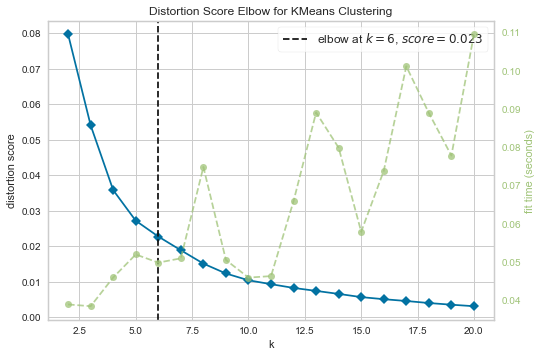

<AxesSubplot:title={'center':'Distortion Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='distortion score'>

In [30]:
kmeans = KMeans()
visualizer = KElbowVisualizer(kmeans, k=(2,21))
visualizer.fit(boba_df[['Latitude', 'Longitude']])
visualizer.show()

In [31]:
# With k=6, visualize the data
k = 6
clusters = KMeans(n_clusters=k).fit(boba_df[['Latitude', 'Longitude']])
boba_df['Cluster'] = clusters.labels_
boba_df.head()

<ipython-input-31-ba50336c82a0>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  boba_df['Cluster'] = clusters.labels_


,Name,Latitude,Longitude,Neighborhood,Cluster
0,OMG Tea,37.725430,-122.402625,Portola,4
1,Tea Plus,37.729718,-122.404286,Portola,4
2,Panda Boba,37.726834,-122.403269,Portola,4
3,HiTea,37.729209,-122.404161,Portola,4
4,Mura Tea Shoppe,37.752410,-122.414530,Mission,4


In [53]:
# create map
map_clusters = folium.Map(location=SF_loc, zoom_start=12, scrollWheelZoom=False)
#folium.GeoJson(nhood_json, name='nhoods').add_to(map_clusters)

# set color scheme for the clusters
x = np.arange(k)
ys = [i + x + (i*x)**2 for i in range(k)]
colors_array = cm.rainbow(np.linspace(0, 1, len(ys)))
rainbow = [colors.rgb2hex(i) for i in colors_array]

# add markers to the map
markers_colors = []
for row in boba_df.itertuples():
    #label = folium.Popup('Cluster {0}, {1} borough.\nNeighbourhood(s): {2}'.format(row.Cluster, row.Borough, row.Neighbourhood))
    folium.CircleMarker(
        [row.Latitude, row.Longitude],
        radius=5,
        #popup=label,
        color=rainbow[row.Cluster-1],
        fill=True,
        fill_color=rainbow[row.Cluster-1],
        fill_opacity=0.7).add_to(map_clusters)
       
map_clusters

While this data is useful, it can only be a determinant if our goal was to be located near other boba shops.
Importantly, population is not a consideration in this visualization. Let's include that in the conversation.

### Finding the ideal neighborhood

Since we previously classified each boba shop in a neighborhood, and neighborhood population data exists, let's recluster based on these two variables

In [33]:
display(boba_df.head())
display(SF_nhood.head())

,Name,Latitude,Longitude,Neighborhood,Cluster
0,OMG Tea,37.725430,-122.402625,Portola,4
1,Tea Plus,37.729718,-122.404286,Portola,4
2,Panda Boba,37.726834,-122.403269,Portola,4
3,HiTea,37.729209,-122.404161,Portola,4
4,Mura Tea Shoppe,37.752410,-122.414530,Mission,4


,NHOOD,SHAPE_AREA,POPULATION,POLY,LONGITUDE,LATITUDE,APPROX_RADIUS,COVERAGE_RADIUS
0,Bayview Hunters Point,5.173093,35894,(POLYGON ((-122.3815777424142 37.7530704309124...,-122.386016,37.730889,2065.129375,3304.207001
1,Bernal Heights,1.077925,23391,(POLYGON ((-122.403612999828 37.74933700015653...,-122.415664,37.740364,942.684720,1508.295552
2,Castro/Upper Market,0.857180,19787,(POLYGON ((-122.4265550005568 37.7694849998470...,-122.435217,37.762319,840.636310,1345.018096
3,Chinatown,0.224639,14542,(POLYGON ((-122.4062259995664 37.7975590002937...,-122.407081,37.796140,430.342978,688.548765
4,Excelsior,1.392175,38666,(POLYGON ((-122.4239820002333 37.7315519997551...,-122.431807,37.718562,1071.319441,1714.111106


In [34]:
nhood_boba = boba_df.groupby('Neighborhood')['Name'].count()
#nhood_boba.rename({'Name': 'Stores'})
display(nhood_boba)

Neighborhood
Castro/Upper Market                2
Chinatown                         21
Excelsior                          2
Financial District/South Beach    12
Glen Park                          1
Haight Ashbury                     3
Hayes Valley                       4
Inner Richmond                     5
Inner Sunset                       6
Japantown                          1
Lakeshore                          7
Lone Mountain/USF                  1
Marina                             1
Mission                            9
Mission Bay                        3
North Beach                        2
Oceanview/Merced/Ingleside         2
Outer Mission                      2
Outer Richmond                     8
Pacific Heights                    1
Portola                            4
Potrero Hill                       2
Russian Hill                       1
South of Market                    7
Sunset/Parkside                   20
Tenderloin                         6
West of Twin Peaks       

In [35]:
df = pd.merge(SF_nhood, nhood_boba, how='left', left_on='NHOOD', right_on='Neighborhood')
df = df[['NHOOD', 'LATITUDE', 'LONGITUDE', 'POPULATION', 'Name', 'SHAPE_AREA']]
df.columns = ['nhood', 'nhood_lat', 'nhood_lng', 'pop', 'stores', 'area']
df

,nhood,nhood_lat,nhood_lng,pop,stores,area
0,Bayview Hunters Point,37.730889,-122.386016,35894,NaN,5.173093
1,Bernal Heights,37.740364,-122.415664,23391,NaN,1.077925
2,Castro/Upper Market,37.762319,-122.435217,19787,2.0,0.857180
3,Chinatown,37.796140,-122.407081,14542,21.0,0.224639
4,Excelsior,37.718562,-122.431807,38666,2.0,1.392175
5,Financial District/South Beach,37.790418,-122.397053,15970,12.0,1.123712
6,Glen Park,37.739605,-122.436326,7788,1.0,0.668438
7,Golden Gate Park,37.769029,-122.481922,171,NaN,1.724570
8,Haight Ashbury,37.768374,-122.444467,16716,3.0,0.556731
9,Hayes Valley,37.774787,-122.429044,17094,4.0,0.490392


In [36]:
df['stores'] = df['stores'].fillna(0)
df

,nhood,nhood_lat,nhood_lng,pop,stores,area
0,Bayview Hunters Point,37.730889,-122.386016,35894,0.0,5.173093
1,Bernal Heights,37.740364,-122.415664,23391,0.0,1.077925
2,Castro/Upper Market,37.762319,-122.435217,19787,2.0,0.857180
3,Chinatown,37.796140,-122.407081,14542,21.0,0.224639
4,Excelsior,37.718562,-122.431807,38666,2.0,1.392175
5,Financial District/South Beach,37.790418,-122.397053,15970,12.0,1.123712
6,Glen Park,37.739605,-122.436326,7788,1.0,0.668438
7,Golden Gate Park,37.769029,-122.481922,171,0.0,1.724570
8,Haight Ashbury,37.768374,-122.444467,16716,3.0,0.556731
9,Hayes Valley,37.774787,-122.429044,17094,4.0,0.490392


In [37]:
df['pop_den'] = df['pop']/df['area']
df['stores_den'] = df['stores']/df['area']
df.head()

,nhood,nhood_lat,nhood_lng,pop,stores,area,pop_den,stores_den
0,Bayview Hunters Point,37.730889,-122.386016,35894,0.0,5.173093,6938.596187,0.000000
1,Bernal Heights,37.740364,-122.415664,23391,0.0,1.077925,21700.020131,0.000000
2,Castro/Upper Market,37.762319,-122.435217,19787,2.0,0.857180,23083.834269,2.333232
3,Chinatown,37.796140,-122.407081,14542,21.0,0.224639,64734.974617,93.483322
4,Excelsior,37.718562,-122.431807,38666,2.0,1.392175,27773.816231,1.436601


## Modeling

In [38]:
from sklearn.preprocessing import StandardScaler

In [39]:
#normalize
scaler = StandardScaler()
kmeans_df = df.drop('nhood', axis=1)
kmeans_df_norm = scaler.fit_transform(kmeans_df)
kmeans_df_norm = pd.DataFrame(kmeans_df_norm, columns = kmeans_df.columns)
kmeans_df_norm.drop(['pop', 'stores', 'area'], axis=1, inplace=True)

In [40]:
kmeans_df_norm.head()

,nhood_lat,nhood_lng,pop_den,stores_den
0,-1.196682,1.586584,-0.941940,-0.359527
1,-0.865137,0.649558,-0.054545,-0.359527
2,-0.096848,0.031579,0.028645,-0.197045
3,1.086662,0.920832,2.532539,6.150463
4,-1.628039,0.139343,0.310587,-0.259485


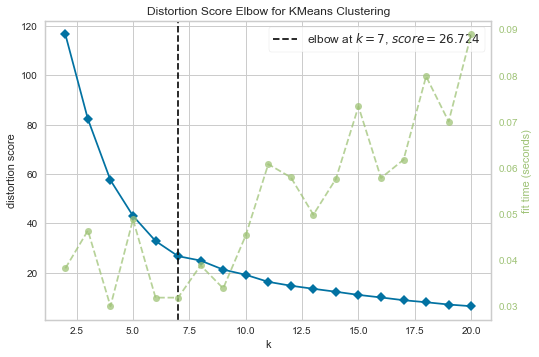

<AxesSubplot:title={'center':'Distortion Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='distortion score'>

In [41]:
kmeans = KMeans()
visualizer = KElbowVisualizer(kmeans, k=(2,21))
visualizer.fit(kmeans_df_norm)
visualizer.show()

In [42]:
model_df = df
k = visualizer.elbow_value_
model = KMeans(n_clusters=k)
model.fit(kmeans_df_norm)
model_df['cluster'] = model.labels_
model_df.head()

,nhood,nhood_lat,nhood_lng,pop,stores,area,pop_den,stores_den,cluster
0,Bayview Hunters Point,37.730889,-122.386016,35894,0.0,5.173093,6938.596187,0.000000,0
1,Bernal Heights,37.740364,-122.415664,23391,0.0,1.077925,21700.020131,0.000000,0
2,Castro/Upper Market,37.762319,-122.435217,19787,2.0,0.857180,23083.834269,2.333232,3
3,Chinatown,37.796140,-122.407081,14542,21.0,0.224639,64734.974617,93.483322,2
4,Excelsior,37.718562,-122.431807,38666,2.0,1.392175,27773.816231,1.436601,0


In [43]:
# create map
map_clusters = folium.Map(location=SF_loc, zoom_start=12, scrollWheelZoom=False)
#folium.GeoJson(nhood_json, name='nhoods').add_to(map_clusters)
# set color scheme for the clusters
x = np.arange(k)
ys = [i + x + (i*x)**2 for i in range(k)]
colors_array = cm.rainbow(np.linspace(0, 1, len(ys)))
rainbow = [colors.rgb2hex(i) for i in colors_array]

# add markers to the map
markers_colors = []
for row in model_df.itertuples():
    html = '<b>{}</b><br>Shops: {}<br>{:.2f} shops/sq.mi<br>{:.0f} ppl/sq.mi'.format(row.nhood, row.stores, row.stores_den, row.pop_den)
    label = folium.Popup(html)
    folium.CircleMarker(
        [row.nhood_lat, row.nhood_lng],
        radius=5,
        popup=label,
        color=rainbow[row.cluster-1],
        fill=True,
        fill_color=rainbow[row.cluster-1],
        fill_opacity=0.7).add_to(map_clusters)

map_clusters

### Examine Clusters
___

In [44]:
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches

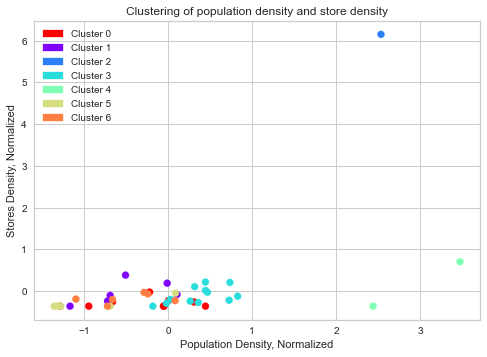

In [45]:
model_df_norm = kmeans_df_norm
model_df_norm['cluster'] = model.labels_

cmap = {cluster: rainbow[cluster-1] for cluster in model_df_norm['cluster']}
model_df_norm_sorted = model_df_norm.sort_values('cluster')
cmap = sorted(cmap.items())
plt.scatter(model_df_norm_sorted['pop_den'], model_df_norm_sorted['stores_den'], 
            color=[cmap[cluster][1] for cluster in model_df_norm_sorted['cluster']])

plt.xlabel('Population Density, Normalized')
plt.ylabel('Stores Density, Normalized')
recs = []
for k, v in cmap:
    recs.append(mpatches.Patch(color=v, label=f'Cluster {k}'))
plt.legend(handles=recs, loc='upper left')
plt.title('Clustering of population density and store density')

plt.show()

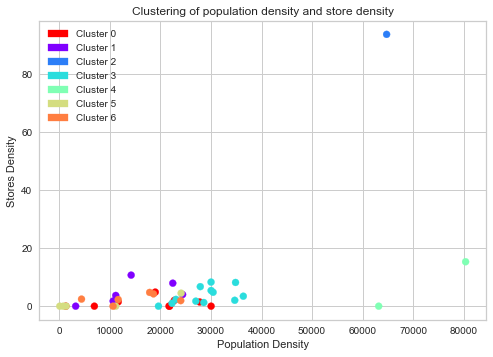

In [46]:
cmap = {cluster: rainbow[cluster-1] for cluster in model_df['cluster']}
model_df_sorted = model_df.sort_values('cluster')
cmap = sorted(cmap.items())
plt.scatter(model_df_sorted['pop_den'], model_df_sorted['stores_den'], 
            color=[cmap[cluster][1] for cluster in model_df_sorted['cluster']])

plt.xlabel('Population Density')
plt.ylabel('Stores Density')
recs = []
for k, v in cmap:
    recs.append(mpatches.Patch(color=v, label=f'Cluster {k}'))
plt.legend(handles=recs, loc='upper left')
plt.title('Clustering of population density and store density')

plt.show()

In [47]:
cluster = model_df[model_df['cluster'] == 0]

print('Cluster {0:.0f}\nAverage population density: {1:.2f} ppl/sqmi\nAverage Store Density: {2:.2f} stores/sqmi'.format(
    cluster['cluster'].mean(),
    cluster['pop_den'].mean(),
    cluster['stores_den'].mean()))
display(cluster)

Cluster 0
Average population density: 18104.09 ppl/sqmi
Average Store Density: 1.09 stores/sqmi


,nhood,nhood_lat,nhood_lng,pop,stores,area,pop_den,stores_den,cluster
0,Bayview Hunters Point,37.730889,-122.386016,35894,0.0,5.173093,6938.596187,0.000000,0
1,Bernal Heights,37.740364,-122.415664,23391,0.0,1.077925,21700.020131,0.000000,0
4,Excelsior,37.718562,-122.431807,38666,2.0,1.392175,27773.816231,1.436601,0
6,Glen Park,37.739605,-122.436326,7788,1.0,0.668438,11651.050593,1.496026,0
17,McLaren Park,37.717937,-122.418694,797,0.0,0.615684,1294.495022,0.000000,0
21,Noe Valley,37.748918,-122.433324,21302,0.0,0.976140,21822.696728,0.000000,0
24,Outer Mission,37.720649,-122.443921,22845,2.0,1.004157,22750.423507,1.991720,0
27,Portola,37.726792,-122.408993,15674,4.0,0.825752,18981.477061,4.844067,0
38,Visitacion Valley,37.712867,-122.410104,18369,0.0,0.611806,30024.240203,0.000000,0


In [48]:
cluster = model_df[model_df['cluster'] == 1]

print('Cluster {0:.0f}\nAverage population density: {1:.2f} ppl/sqmi\nAverage Store Density: {2:.2f} stores/sqmi'.format(
    cluster['cluster'].mean(),
    cluster['pop_den'].mean(),
    cluster['stores_den'].mean()))
display(cluster)

Cluster 1
Average population density: 14351.73 ppl/sqmi
Average Store Density: 4.67 stores/sqmi


,nhood,nhood_lat,nhood_lng,pop,stores,area,pop_den,stores_den,cluster
5,Financial District/South Beach,37.790418,-122.397053,15970,12.0,1.123712,14211.824195,10.678891,1
19,Mission Bay,37.771663,-122.393559,9083,3.0,0.813052,11171.489532,3.689802,1
22,North Beach,37.804648,-122.409643,12178,2.0,0.499307,24389.822566,4.005555,1
28,Potrero Hill,37.758872,-122.393602,12111,2.0,1.137271,10649.174096,1.758595,1
33,South of Market,37.777249,-122.405928,19866,7.0,0.884979,22447.990627,7.909792,1
36,Treasure Island,37.820655,-122.369540,2880,0.0,0.888870,3240.070080,0.000000,1


In [49]:
cluster = model_df[model_df['cluster'] == 2]

print('Cluster {0:.0f}\nAverage population density: {1:.2f} ppl/sqmi\nAverage Store Density: {2:.2f} stores/sqmi'.format(
    cluster['cluster'].mean(),
    cluster['pop_den'].mean(),
    cluster['stores_den'].mean()))
display(cluster)

Cluster 2
Average population density: 64734.97 ppl/sqmi
Average Store Density: 93.48 stores/sqmi


,nhood,nhood_lat,nhood_lng,pop,stores,area,pop_den,stores_den,cluster
3,Chinatown,37.79614,-122.407081,14542,21.0,0.224639,64734.974617,93.483322,2


In [50]:
cluster = model_df[model_df['cluster'] == 3]

print('Cluster {0:.0f}\nAverage population density: {1:.2f} ppl/sqmi\nAverage Store Density: {2:.2f} stores/sqmi'.format(
    cluster['cluster'].mean(),
    cluster['pop_den'].mean(),
    cluster['stores_den'].mean()))
display(cluster)

Cluster 3
Average population density: 28739.61 ppl/sqmi
Average Store Density: 3.76 stores/sqmi


,nhood,nhood_lat,nhood_lng,pop,stores,area,pop_den,stores_den,cluster
2,Castro/Upper Market,37.762319,-122.435217,19787,2.0,0.857180,23083.834269,2.333232,3
8,Haight Ashbury,37.768374,-122.444467,16716,3.0,0.556731,30025.257022,5.388596,3
9,Hayes Valley,37.774787,-122.429044,17094,4.0,0.490392,34857.844601,8.156744,3
10,Inner Richmond,37.780950,-122.465434,20749,5.0,0.744058,27886.254475,6.719903,3
12,Japantown,37.785092,-122.434135,3622,1.0,0.120687,30011.479278,8.285886,3
15,Lone Mountain/USF,37.777619,-122.449600,15643,1.0,0.579263,27005.019172,1.726332,3
16,Marina,37.801442,-122.436367,22813,1.0,1.023216,22295.381888,0.977310,3
18,Mission,37.760126,-122.415504,57298,9.0,1.883578,30419.764756,4.778140,3
26,Pacific Heights,37.791019,-122.434827,22727,1.0,0.795220,28579.514534,1.257514,3
30,Presidio Heights,37.786313,-122.451658,9853,0.0,0.502311,19615.339654,0.000000,3


In [51]:
cluster = model_df[model_df['cluster'] == 4]

print('Cluster {0:.0f}\nAverage population density: {1:.2f} ppl/sqmi\nAverage Store Density: {2:.2f} stores/sqmi'.format(
    cluster['cluster'].mean(),
    cluster['pop_den'].mean(),
    cluster['stores_den'].mean()))
display(cluster)

Cluster 4
Average population density: 71763.91 ppl/sqmi
Average Store Density: 7.64 stores/sqmi


,nhood,nhood_lat,nhood_lng,pop,stores,area,pop_den,stores_den,cluster
20,Nob Hill,37.791803,-122.414951,25700,0.0,0.406838,63170.048268,0.000000,4
35,Tenderloin,37.783157,-122.415263,31565,6.0,0.392806,80357.777557,15.274724,4


In [52]:
cluster = model_df[model_df['cluster'] == 5]

print('Cluster {0:.0f}\nAverage population density: {1:.2f} ppl/sqmi\nAverage Store Density: {2:.2f} stores/sqmi'.format(
    cluster['cluster'].mean(),
    cluster['pop_den'].mean(),
    cluster['stores_den'].mean()))
display(cluster)

Cluster 5
Average population density: 7506.60 ppl/sqmi
Average Store Density: 0.89 stores/sqmi


,nhood,nhood_lat,nhood_lng,pop,stores,area,pop_den,stores_den,cluster
7,Golden Gate Park,37.769029,-122.481922,171,0.0,1.724570,99.155178,0.000000,5
14,Lincoln Park,37.784484,-122.501408,320,0.0,0.394752,810.635078,0.000000,5
25,Outer Richmond,37.778065,-122.491823,43148,8.0,1.790732,24095.176892,4.467447,5
29,Presidio,37.797377,-122.466370,3235,0.0,2.363972,1368.459405,0.000000,5
32,Seacliff,37.786685,-122.486868,2376,0.0,0.212911,11159.573929,0.000000,5


Assuming the ideal location would be a place with lots of potential customers and low competition (i.e. high population density, high store density), one should look to open a store in the neighborhood of Chinatown